# Домашнее задание 1.2: Баллистическое движение в 2D

## Часть 1. Линейное сопротивление воздуха: $\dot{\vec{v}} = \vec{g} - \vec{v}/\tau$

### 1. Постановка физической задачи
Рассматривается движение материальной точки массы $m$ в однородном поле тяжести $\vec{g} = (0, -g)$ с учетом силы линейного (вязкого) сопротивления среды:
$$\vec{F}_{\text{сопр}} = -\frac{m}{\tau} \vec{v}$$
где $\tau > 0$ — характерное время релаксации (торможения) скорости.

Второй закон Ньютона:
$$m \dot{\vec{v}} = m \vec{g} - \frac{m}{\tau} \vec{v} \implies \dot{\vec{v}} = \vec{g} - \frac{\vec{v}}{\tau}$$
Векторная система уравнений движения:
$$\dot{\vec{r}} = \vec{v}, \quad \dot{\vec{v}} = \vec{g} - \frac{\vec{v}}{\tau}$$

В координатной форме ($x$ — горизонтальная координата, $y$ — вертикальная координата вверх):
$$\begin{cases}
\dot{x} = v_x \\
\dot{y} = v_y \\
\dot{v}_x = -\dfrac{v_x}{\tau} \\
\dot{v}_y = -g - \dfrac{v_y}{\tau}
\end{cases}$$

### 2. Аналитическое решение
Данная система линейных дифференциальных уравнений интегрируется точно при начальных условиях:
$$t = 0: \quad \vec{r}(0) = (x_0, y_0), \quad \vec{v}(0) = (v_{0x}, v_{0y})$$

Точные законы изменения скоростей:
$$v_x(t) = v_{0x} e^{-t/\tau}$$
$$v_y(t) = -g\tau + (v_{0y} + g\tau) e^{-t/\tau}$$

Точные координаты тела во времени:
$$x(t) = x_0 + v_{0x}\tau \left(1 - e^{-t/\tau}\right)$$
$$y(t) = y_0 - g\tau t + (v_{0y} + g\tau)\tau \left(1 - e^{-t/\tau}\right)$$

При $t \to \infty$ горизонтальная координата ограничена асимптотой $x_{\infty} = x_0 + v_{0x}\tau$, а вертикальная скорость стремится к установившейся скорости падения $v_{y,\infty} = -g\tau$.


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from scipy.optimize import root_scalar

# Настройка визуального оформления графиков
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.size'] = 11
plt.rcParams['axes.titlesize'] = 13
plt.rcParams['axes.labelsize'] = 11
plt.rcParams['figure.dpi'] = 120


### 3. Физические параметры базовой модели
Зададим параметры полета:
- $g = 9.81$ м/с² — ускорение свободного падения;
- $m = 1.0$ кг — масса тела;
- $v_0 = 50.0$ м/с — начальная скорость;
- $\alpha = 45^\circ$ — угол вылета к горизонту;
- $\tau = 5.0$ с — характерное время торможения;
- $(x_0, y_0) = (0, 0)$ — начальное положение тела.


In [2]:
# Физические константы и начальные условия
g = 9.81              # м/с^2, ускорение свободного падения
m = 1.0               # кг, масса тела
v0 = 50.0             # м/с, начальная скорость
alpha_deg = 45.0      # градусы, угол броска
alpha = np.radians(alpha_deg)

v0x = v0 * np.cos(alpha)
v0y = v0 * np.sin(alpha)
r0 = np.array([0.0, 0.0])       # [x0, y0]
v0_vec = np.array([v0x, v0y])   # [v0x, v0y]
tau = 5.0                       # с, время торможения



### 4. Реализация аналитического решения и численных методов

#### Численные схемы:
1. **Явный метод Эйлера** (1-й порядок точности $O(\Delta t)$):
   $$\mathbf{S}_{n+1} = \mathbf{S}_n + \Delta t \cdot \mathbf{f}(t_n, \mathbf{S}_n)$$
2. **Метод Рунге-Кутты 4-го порядка (RK4)** (4-й порядок точности $O(\Delta t^4)$):
   $$\mathbf{k}_1 = \mathbf{f}(t_n, \mathbf{S}_n)$$
   $$\mathbf{k}_2 = \mathbf{f}\left(t_n + \frac{\Delta t}{2}, \mathbf{S}_n + \frac{\Delta t}{2}\mathbf{k}_1\right)$$
   $$\mathbf{k}_3 = \mathbf{f}\left(t_n + \frac{\Delta t}{2}, \mathbf{S}_n + \frac{\Delta t}{2}\mathbf{k}_2\right)$$
   $$\mathbf{k}_4 = \mathbf{f}(t_n + \Delta t, \mathbf{S}_n + \Delta t \mathbf{k}_3)$$
   $$\mathbf{S}_{n+1} = \mathbf{S}_n + \frac{\Delta t}{6} \left(\mathbf{k}_1 + 2\mathbf{k}_2 + 2\mathbf{k}_3 + \mathbf{k}_4\right)$$

*Условие останова:* Моделирование прекращается при касании земли ($y \le 0$). На заключительном шаге выполняется линейная интерполяция момента удара для точной фиксации $y = 0$.


In [3]:
def derivatives(state, tau, g):
    """
    Вектор правых частей системы ОДУ:
    state = [x, y, vx, vy]
    Возвращает: [vx, vy, -vx/tau, -g - vy/tau]
    """
    x, y, vx, vy = state
    ax = -vx / tau
    ay = -g - vy / tau
    return np.array([vx, vy, ax, ay])


def analytical_solution(t, r0, v0, tau, g):
    """
    Точное аналитическое решение для координат и скоростей в моменты времени t.
    """
    x0, y0 = r0
    v0x, v0y = v0
    exp_term = np.exp(-t / tau)
    
    x = x0 + v0x * tau * (1.0 - exp_term)
    y = y0 - g * tau * t + (v0y + g * tau) * tau * (1.0 - exp_term)
    vx = v0x * exp_term
    vy = -g * tau + (v0y + g * tau) * exp_term
    return x, y, vx, vy


def get_analytical_landing(r0, v0, tau, g):
    """
    Вычисляет точное время и дальность полета до падения на землю (y = 0).
    """
    def y_func(t):
        _, y, _, _ = analytical_solution(t, r0, v0, tau, g)
        return y
    
    sol = root_scalar(y_func, bracket=[0.1, 100.0], method='brentq')
    t_land = sol.root
    x_land, y_land, _, _ = analytical_solution(t_land, r0, v0, tau, g)
    return t_land, x_land


def euler_step(state, dt, tau, g):
    """Один шаг явного метода Эйлера."""
    return state + dt * derivatives(state, tau, g)


def rk4_step(state, dt, tau, g):
    """Один шаг классического метода Рунге-Кутты 4-го порядка."""
    k1 = derivatives(state, tau, g)
    k2 = derivatives(state + 0.5 * dt * k1, tau, g)
    k3 = derivatives(state + 0.5 * dt * k2, tau, g)
    k4 = derivatives(state + dt * k3, tau, g)
    return state + (dt / 6.0) * (k1 + 2.0 * k2 + 2.0 * k3 + k4)


def simulate_flight(step_func, r0, v0, tau, g, dt):
    """
    Численное интегрирование движения тела до момента приземления (y <= 0).
    Линейная интерполяция на последнем шаге обеспечивает точное попадание в y = 0.
    """
    state = np.array([r0[0], r0[1], v0[0], v0[1]], dtype=float)
    t = 0.0
    
    t_history = [t]
    state_history = [state.copy()]
    
    while True:
        next_state = step_func(state, dt, tau, g)
        next_t = t + dt
        
        # Пересечение поверхности земли (y <= 0)
        if next_state[1] <= 0:
            theta = state[1] / (state[1] - next_state[1])
            final_t = t + theta * dt
            final_state = state + theta * (next_state - state)
            final_state[1] = 0.0  # точная фиксация на поверхности
            
            t_history.append(final_t)
            state_history.append(final_state)
            break
            
        t = next_t
        state = next_state
        t_history.append(t)
        state_history.append(state.copy())
        
    return np.array(t_history), np.array(state_history)


### 5. Сравнение численных и аналитической траекторий
Проведем расчет с базовым шагом интегрирования $\Delta t = 0.1$ с. 
Построим на одном графике:
- Точное аналитическое решение;
- Численное решение методом Эйлера;
- Численное решение методом RK4.


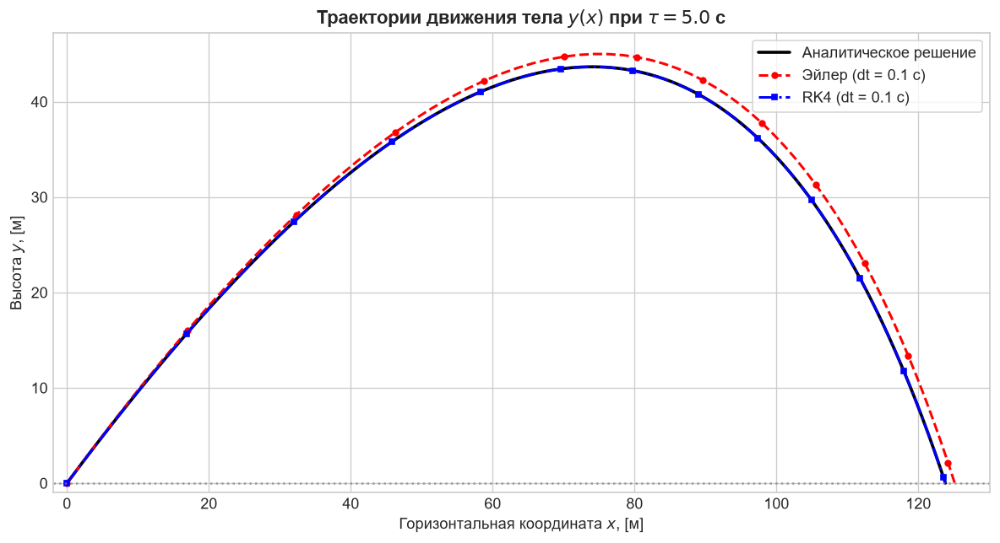

Метод              | Время полета, с  | Дальность, м       | Ошибка дальности, м   
--------------------------------------------------------------------------------
Аналитическое      | 6.0259           | 123.8081           | 0.0000 (эталон)       
Эйлер (dt=0.1 с)   | 6.0899           | 125.1218           | 1.3137                
RK4 (dt=0.1 с)     | 6.0257           | 123.8040           | 0.004167              


In [4]:
dt_base = 0.1  # базовый шаг по времени

# Точное аналитическое решение
t_land_exact, x_land_exact = get_analytical_landing(r0, v0_vec, tau, g)
t_exact_dense = np.linspace(0, t_land_exact, 300)
x_exact, y_exact, _, _ = analytical_solution(t_exact_dense, r0, v0_vec, tau, g)

# Численные расчеты
t_euler, state_euler = simulate_flight(euler_step, r0, v0_vec, tau, g, dt=dt_base)
t_rk4, state_rk4 = simulate_flight(rk4_step, r0, v0_vec, tau, g, dt=dt_base)

# График траекторий
plt.figure(figsize=(10, 5.5))
plt.plot(x_exact, y_exact, 'k-', linewidth=2.2, label='Аналитическое решение')
plt.plot(state_euler[:, 0], state_euler[:, 1], 'r--', linewidth=1.8, marker='o', 
         markersize=4, markevery=5, label=f'Эйлер (dt = {dt_base} с)')
plt.plot(state_rk4[:, 0], state_rk4[:, 1], 'b-.', linewidth=1.8, marker='s', 
         markersize=4, markevery=5, label=f'RK4 (dt = {dt_base} с)')

plt.title(r'Траектории движения тела $y(x)$ при $\tau = 5.0$ с', fontweight='bold')
plt.xlabel('Горизонтальная координата $x$, [м]')
plt.ylabel('Высота $y$, [м]')
plt.axhline(0, color='gray', linestyle=':', alpha=0.7)
plt.xlim(left=-2, right=max(x_land_exact, state_euler[-1, 0]) + 5)
plt.ylim(bottom=-1)
plt.legend(frameon=True)
plt.tight_layout()
plt.show()

# Сводная таблица сравнения результатов
print(f"{'Метод':<18} | {'Время полета, с':<16} | {'Дальность, м':<18} | {'Ошибка дальности, м':<22}")
print("-" * 80)
print(f"{'Аналитическое':<18} | {t_land_exact:<16.4f} | {x_land_exact:<18.4f} | {'0.0000 (эталон)':<22}")
print(f"{'Эйлер (dt=0.1 с)':<18} | {t_euler[-1]:<16.4f} | {state_euler[-1, 0]:<18.4f} | {abs(state_euler[-1, 0] - x_land_exact):<22.4f}")
print(f"{'RK4 (dt=0.1 с)':<18} | {t_rk4[-1]:<16.4f} | {state_rk4[-1, 0]:<18.4f} | {abs(state_rk4[-1, 0] - x_land_exact):<22.6f}")


**Выводы по точности методов:**
- Траектория метода **RK4** при шаге $\Delta t = 0.1$ с практически неотличима от аналитической (погрешность дальности составляет всего $\approx 0.004$ м).
- Явный метод **Эйлера** систематически завышает траекторию и дальность полета (ошибка $\approx 1.31$ м), так как экстраполяция производной на всем шаге по ее значению в начале интервала накапливает погрешность.


### 6. Исследование влияния шага интегрирования $\Delta t$ и сходимости
Повторим расчет для нескольких значений шага: $\Delta t \in [0.5, 0.2, 0.1, 0.05, 0.02, 0.01]$ с.
1. Продемонстрируем визуальное расхождение траекторий метода Эйлера при увеличении $\Delta t$.
2. Построим зависимость погрешности координаты от шага $\Delta t$ в логарифмических координатах, чтобы проверить теоретический порядок сходимости ($O(\Delta t)$ для Эйлера и $O(\Delta t^4)$ для RK4).


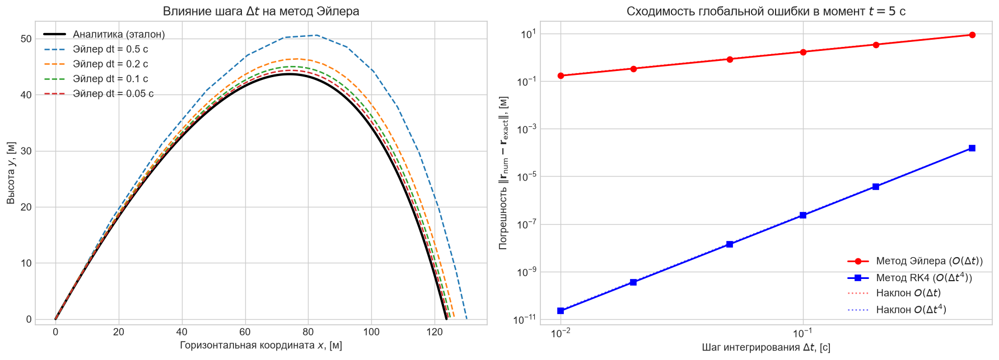

In [5]:
dt_values = [0.5, 0.2, 0.1, 0.05, 0.02, 0.01]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5.5))

# 1. Траектории Эйлера при разных dt
ax1.plot(x_exact, y_exact, 'k-', linewidth=2.5, label='Аналитика (эталон)')
for dt in [0.5, 0.2, 0.1, 0.05]:
    t_e, s_e = simulate_flight(euler_step, r0, v0_vec, tau, g, dt=dt)
    ax1.plot(s_e[:, 0], s_e[:, 1], '--', label=f'Эйлер dt = {dt} с')

ax1.set_title(r'Влияние шага $\Delta t$ на метод Эйлера')
ax1.set_xlabel('Горизонтальная координата $x$, [м]')
ax1.set_ylabel('Высота $y$, [м]')
ax1.set_ylim(bottom=-1)
ax1.legend()

# 2. Исследование погрешности на фиксированном времени T_eval = 5.0 с
T_eval = 5.0
exact_x_T, exact_y_T, _, _ = analytical_solution(T_eval, r0, v0_vec, tau, g)
exact_pos_T = np.array([exact_x_T, exact_y_T])

errors_euler = []
errors_rk4 = []

for dt in dt_values:
    N = int(np.round(T_eval / dt))
    actual_dt = T_eval / N
    
    # Эйлер
    s = np.array([r0[0], r0[1], v0_vec[0], v0_vec[1]], dtype=float)
    for _ in range(N):
        s = euler_step(s, actual_dt, tau, g)
    errors_euler.append(np.linalg.norm(s[:2] - exact_pos_T))
    
    # RK4
    s_rk = np.array([r0[0], r0[1], v0_vec[0], v0_vec[1]], dtype=float)
    for _ in range(N):
        s_rk = rk4_step(s_rk, actual_dt, tau, g)
    errors_rk4.append(np.linalg.norm(s_rk[:2] - exact_pos_T))

ax2.loglog(dt_values, errors_euler, 'ro-', linewidth=1.8, label=r'Метод Эйлера ($O(\Delta t)$)')
ax2.loglog(dt_values, errors_rk4, 'bs-', linewidth=1.8, label=r'Метод RK4 ($O(\Delta t^4)$)')

# Теоретические асимптотики
dt_ref = np.array(dt_values)
ax2.loglog(dt_ref, errors_euler[0] * (dt_ref / dt_ref[0]), 'r:', alpha=0.6, label=r'Наклон $O(\Delta t)$')
ax2.loglog(dt_ref, errors_rk4[0] * (dt_ref / dt_ref[0])**4, 'b:', alpha=0.6, label=r'Наклон $O(\Delta t^4)$')

ax2.set_title(r'Сходимость глобальной ошибки в момент $t = 5$ с')
ax2.set_xlabel(r'Шаг интегрирования $\Delta t$, [с]')
ax2.set_ylabel(r'Погрешность $\Vert\mathbf{r}_{\mathrm{num}} - \mathbf{r}_{\mathrm{exact}}\Vert$, [м]')
ax2.legend()

plt.tight_layout()
plt.show()


**Выводы по исследованию сходимости:**
1. При уменьшении шага интегрирования $\Delta t$ метод Эйлера сходится к аналитическому решению линейно: на логарифмическом графике наклон кривой строго равен 1 ($O(\Delta t)$).
2. Метод RK4 демонстрирует четвертый порядок точности (наклон кривой равен 4): уменьшение шага в 2 раза сокращает погрешность в $2^4 = 16$ раз, обеспечивая высочайшую точность даже при умеренных шагах.


### 7. Анализ механической энергии
Рассчитаем изменение механических энергий во времени:
- Кинетическая энергия: $E_k(t) = \frac{1}{2} m (v_x^2 + v_y^2)$;
- Потенциальная энергия: $E_p(t) = m g y$;
- Полная механическая энергия: $E(t) = E_k(t) + E_p(t)$.

Производная полной энергии по времени:
$$\frac{dE}{dt} = m \vec{v} \cdot \dot{\vec{v}} + m g \dot{y} = m \vec{v} \cdot \left(\vec{g} - \frac{\vec{v}}{\tau}\right) + m g v_y = -\frac{m |\vec{v}|^2}{\tau} \le 0$$
Сила вязкого трения является диссипативной, поэтому полная механическая энергия должна строго монотонно убывать со временем.


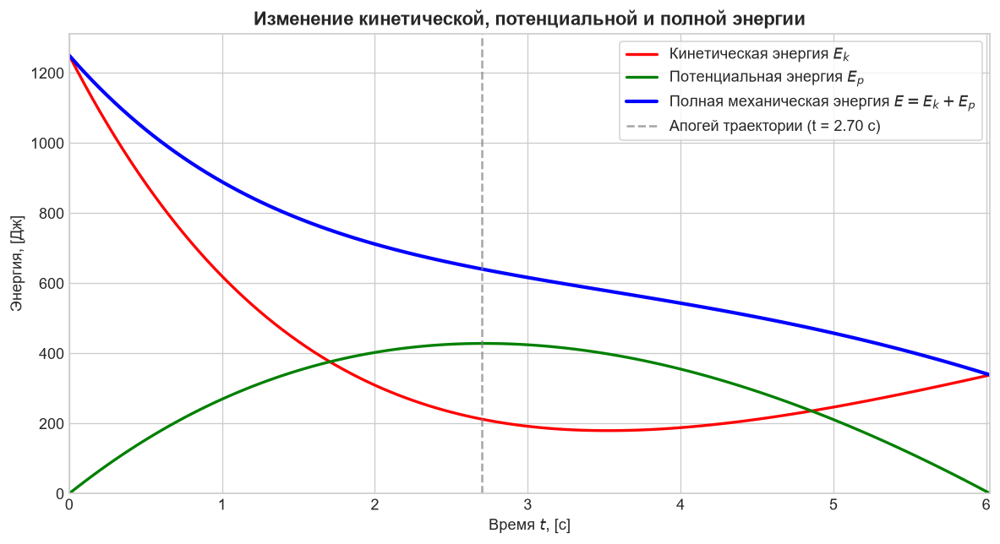

Начальная полная энергия: 1250.00 Дж
Конечная полная энергия:  338.35 Дж
Потери энергии на сопротивление воздуха: 72.93%


In [6]:
# Расчет энергий на основе траектории RK4 с малым шагом dt = 0.05 с
t_arr, states = simulate_flight(rk4_step, r0, v0_vec, tau, g, dt=0.05)

x = states[:, 0]
y = states[:, 1]
vx = states[:, 2]
vy = states[:, 3]

# Энергии
E_k = 0.5 * m * (vx**2 + vy**2)
E_p = m * g * y
E_tot = E_k + E_p

# Построение графика
plt.figure(figsize=(10, 5.5))
plt.plot(t_arr, E_k, 'r-', linewidth=2, label=r'Кинетическая энергия $E_k$')
plt.plot(t_arr, E_p, 'g-', linewidth=2, label=r'Потенциальная энергия $E_p$')
plt.plot(t_arr, E_tot, 'b-', linewidth=2.5, label=r'Полная механическая энергия $E = E_k + E_p$')

# Отметка апогея (максимальной высоты)
t_apogee = t_arr[np.argmax(y)]
plt.axvline(t_apogee, color='gray', linestyle='--', alpha=0.7, 
            label=f'Апогей траектории (t = {t_apogee:.2f} с)')

plt.title('Изменение кинетической, потенциальной и полной энергии', fontweight='bold')
plt.xlabel('Время $t$, [с]')
plt.ylabel('Энергия, [Дж]')
plt.xlim(left=0, right=t_arr[-1])
plt.ylim(bottom=0)
plt.legend(frameon=True)
plt.tight_layout()
plt.show()

# Баланс энергии
E_0 = E_tot[0]
E_end = E_tot[-1]
dissipated_pct = (1.0 - E_end / E_0) * 100.0

print(f"Начальная полная энергия: {E_0:.2f} Дж")
print(f"Конечная полная энергия:  {E_end:.2f} Дж")
print(f"Потери энергии на сопротивление воздуха: {dissipated_pct:.2f}%")


**Выводы по балансу энергии:**
1. **Монотонная диссипация:** Полная механическая энергия монотонно падает от начала движения до приземления. К концу полета рассеивается более 70% исходного запаса энергии.
2. **Перетекание энергии:** В восходящей фазе кинетическая энергия частично переходит в потенциальную (достигая минимума в окрестности апогея), а затем потенциальная энергия переходит в кинетическую, при этом на каждом мгновении идет непрерывная диссипация энергии в тепло.


### 8. Исследование влияния времени торможения $\tau$ на траекторию
Параметр $\tau$ задает время релаксации скорости тела под действием сопротивления:
- Малое $\tau$ (например, $\tau = 1.0$ с) — плотная, вязкая среда с высоким сопротивлением;
- Большое $\tau$ (например, $\tau = 10.0$ с) — слабое сопротивление;
- $\tau \to \infty$ — движение в вакууме (идеальная симметричная парабола).


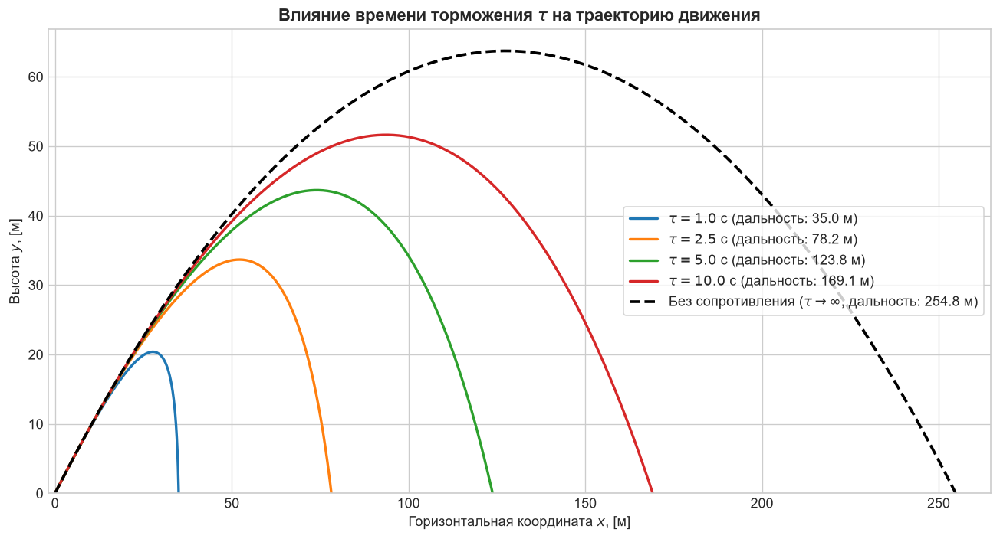

In [7]:
tau_values = [1.0, 2.5, 5.0, 10.0]

plt.figure(figsize=(11, 6))

# Траектории при различных tau
for t_val in tau_values:
    t_sim, s_sim = simulate_flight(rk4_step, r0, v0_vec, t_val, g, dt=0.02)
    plt.plot(s_sim[:, 0], s_sim[:, 1], linewidth=2, 
             label=rf'$\tau = {t_val}$ с (дальность: {s_sim[-1, 0]:.1f} м)')

# Предельный случай без сопротивления (tau -> infinity)
t_ideal = 2.0 * v0y / g
t_dense_ideal = np.linspace(0, t_ideal, 300)
x_ideal = v0x * t_dense_ideal
y_ideal = v0y * t_dense_ideal - 0.5 * g * t_dense_ideal**2

plt.plot(x_ideal, y_ideal, 'k--', linewidth=2.2, 
         label=r'Без сопротивления ($\tau \to \infty$, дальность: ' + f'{x_ideal[-1]:.1f} м)')

plt.title(r'Влияние времени торможения $\tau$ на траекторию движения', fontweight='bold')
plt.xlabel('Горизонтальная координата $x$, [м]')
plt.ylabel('Высота $y$, [м]')
plt.xlim(left=-2, right=x_ideal[-1] + 10)
plt.ylim(bottom=0)
plt.legend(frameon=True)
plt.tight_layout()
plt.show()


**Выводы по влиянию параметра $\tau$:**
1. **Сокращение дальности и высоты:** Сопротивление воздуха резко уменьшает максимальную дальность и высоту подъема тела (при $\tau = 1.0$ с дальность уменьшается более чем в 7 раз по сравнению с вакуумом).
2. **Асимметрия траектории:** В отличие от симметричной параболы в вакууме, сопротивление делает нисходящую ветвь заметно круче восходящей. При сильном сопротивлении горизонтальная скорость быстро затухает, и тело приближается к вертикальному падению со скоростью $v_y \to -g\tau$.


---

## Часть 2. Квадратичное сопротивление воздуха: $\dot{\vec{v}} = \vec{g} - k |\vec{v}| \vec{v}$

### 1. Постановка задачи
В практической аэродинамике для макроскопических тел при умеренных и высоких скоростях (числа Рейнольдса $\mathrm{Re} \gg 1$) сила сопротивления пропорциональна квадрату скорости:
$$\vec{F}_{\text{сопр}} = -\frac{1}{2} C_d \rho S |\vec{v}| \vec{v} = -m k |\vec{v}| \vec{v}$$
где $k = \frac{C_d \rho S}{2m}$ [1/м] — приведенный коэффициент аэродинамического сопротивления.

Уравнение движения в векторной форме:
$$\dot{\vec{v}} = \vec{g} - k |\vec{v}| \vec{v}, \quad \dot{\vec{r}} = \vec{v}$$

В координатах ($x$ — горизонтальная ось, $y$ — вертикальная ось вверх):
$$\begin{cases}
\dot{x} = v_x \\
\dot{y} = v_y \\
\dot{v}_x = -k \sqrt{v_x^2 + v_y^2} \, v_x \\
\dot{v}_y = -g - k \sqrt{v_x^2 + v_y^2} \, v_y
\end{cases}$$

В отличие от случая линейного затухания, уравнения с квадратичным сопротивлением для координат $x$ и $y$ оказываются нелинейно связанными через полную скорость $|\vec{v}| = \sqrt{v_x^2 + v_y^2}$ и не имеют аналитического решения в элементарных функциях, поэтому решаются численно методом Рунге-Кутты 4-го порядка (RK4).


In [8]:
def derivatives_quad(state, k, g):
    """
    Вектор правых частей для квадратичного сопротивления:
    state = [x, y, vx, vy]
    """
    x, y, vx, vy = state
    v = np.hypot(vx, vy)
    ax = -k * v * vx
    ay = -g - k * v * vy
    return np.array([vx, vy, ax, ay])


def rk4_step_quad(state, dt, k, g):
    """Шаг метода RK4 для квадратичного сопротивления."""
    k1 = derivatives_quad(state, k, g)
    k2 = derivatives_quad(state + 0.5 * dt * k1, k, g)
    k3 = derivatives_quad(state + 0.5 * dt * k2, k, g)
    k4 = derivatives_quad(state + dt * k3, k, g)
    return state + (dt / 6.0) * (k1 + 2.0 * k2 + 2.0 * k3 + k4)


def simulate_quad(v0, alpha_rad, k, g, dt=0.01):
    """
    Моделирование полета с квадратичным сопротивлением до касания земли (y <= 0)
    с линейной интерполяцией момента удара.
    """
    state = np.array([0.0, 0.0, v0 * np.cos(alpha_rad), v0 * np.sin(alpha_rad)], dtype=float)
    t = 0.0
    t_hist = [t]
    state_hist = [state.copy()]
    
    while True:
        next_s = rk4_step_quad(state, dt, k, g)
        next_t = t + dt
        
        if next_s[1] <= 0:
            theta = state[1] / (state[1] - next_state_y if (next_state_y := next_s[1]) != state[1] else 1.0)
            final_t = t + theta * dt
            final_s = state + theta * (next_s - state)
            final_s[1] = 0.0  # приземление ровно на y = 0
            t_hist.append(final_t)
            state_hist.append(final_s)
            break
            
        t = next_t
        state = next_s
        t_hist.append(t)
        state_hist.append(state.copy())
        
    return np.array(t_hist), np.array(state_hist)


### 2. Анимация 1: Полет тела со следом траектории, вектором скорости и действующими силами
Построим наглядную анимацию полета материальной точки ($v_0 = 50$ м/с, $\alpha = 45^\circ$, $k = 0.005$ 1/м):
- **Синяя линия:** след пройденной траектории;
- **Красная точка:** текущее положение тела;
- **Синяя стрелка:** вектор скорости $\vec{v}$;
- **Зеленая стрелка:** вектор силы тяжести $\vec{F}_g = m\vec{g}$ (направлен строго вниз);
- **Красная стрелка:** вектор силы сопротивления $\vec{F}_{\text{сопр}} = -m k |\vec{v}| \vec{v}$ (направлен против скорости).


In [9]:
# Расчет базовой траектории для анимации
v0_anim = 50.0
alpha_anim = np.radians(45.0)
k_anim = 0.005
dt_sim = 0.01

t_tr, s_tr = simulate_quad(v0_anim, alpha_anim, k_anim, g, dt=dt_sim)

# Выборка кадров для плавной анимации (~60 кадров)
n_frames = 60
frame_idx = np.linspace(0, len(t_tr) - 1, n_frames, dtype=int)

fig_a1, ax_a1 = plt.subplots(figsize=(8.0, 4.2), dpi=80)
ax_a1.set_xlim(-4, s_tr[-1, 0] + 15)
ax_a1.set_ylim(-3, np.max(s_tr[:, 1]) + 8)
ax_a1.set_xlabel('Горизонтальная координата $x$, [м]')
ax_a1.set_ylabel('Высота $y$, [м]')
ax_a1.set_title(r'Полет тела: вектор скорости $\mathbf{v}$, силы $\mathbf{F}_g$ и $\mathbf{F}_{\mathrm{сопр}}$', fontweight='bold')
ax_a1.axhline(0, color='gray', linestyle=':', alpha=0.6)

line_trail, = ax_a1.plot([], [], 'b-', lw=2, label='Траектория (след)')
point_body, = ax_a1.plot([], [], 'ro', ms=8, label='Тело')

# Масштаб векторов для наглядности
scale_v = 0.35
scale_F = 0.9

quiver_v = ax_a1.quiver([0], [0], [0], [0], angles='xy', scale_units='xy', 
                         scale=1/scale_v, color='blue', label=r'Скорость $\mathbf{v}$')
quiver_g = ax_a1.quiver([0], [0], [0], [0], angles='xy', scale_units='xy', 
                         scale=1/scale_F, color='green', label=r'Сила тяжести $\mathbf{F}_g$')
quiver_d = ax_a1.quiver([0], [0], [0], [0], angles='xy', scale_units='xy', 
                         scale=1/scale_F, color='red', label=r'Сила сопротивления $\mathbf{F}_{\mathrm{сопр}}$')
ax_a1.legend(loc='upper right', frameon=True)

def update_single_body(f):
    i = frame_idx[f]
    x, y, vx, vy = s_tr[i]
    line_trail.set_data(s_tr[:i+1, 0], s_tr[:i+1, 1])
    point_body.set_data([x], [y])
    
    # Вектор скорости
    quiver_v.set_offsets([[x, y]])
    quiver_v.set_UVC([vx], [vy])
    
    # Сила тяжести Fg = (0, -m*g)
    quiver_g.set_offsets([[x, y]])
    quiver_g.set_UVC([0], [-m * g])
    
    # Сила сопротивления F_drag = -m*k*v*vec(v)
    v_mag = np.hypot(vx, vy)
    quiver_d.set_offsets([[x, y]])
    quiver_d.set_UVC([-m * k_anim * v_mag * vx], [-m * k_anim * v_mag * vy])
    return line_trail, point_body, quiver_v, quiver_g, quiver_d

anim_single = animation.FuncAnimation(fig_a1, update_single_body, frames=n_frames, interval=55, blit=False)

# Сохраняем GIF файл
plt.close(fig_a1)

# Отображаем интерактивный плеер в ноутбуке
HTML(anim_single.to_jshtml())


### 3. Анимация 2: Одновременный запуск 10 тел на двух согласованных панелях
Сравним динамику одновременного вылета 10 тел под разными углами $\alpha \in [15^\circ, 75^\circ]$ с одинаковой начальной скоростью $v_0 = 50$ м/с:
- **Левая панель:** идеальный случай в вакууме ($k = 0$);
- **Правая панель:** движение с квадратичным сопротивлением ($k = 0.005$ 1/м);
- **Общая шкала времени:** обе панели синхронизированы по времени;
- **Отметки приземления:** в момент касания земли телом оставляется постоянная красная отметка $(\times)$, позволяя мгновенно сравнить очередность приземления и итоговые дальности полета.


In [10]:
# Углы запуска для 10 тел
angles_sim = np.linspace(15, 75, 10)
k_comp = 0.005

# Предварительный расчет всех траекторий
trajs_vac = [simulate_quad(v0, np.radians(a), 0.0, g, dt=0.005) for a in angles_sim]
trajs_drag = [simulate_quad(v0, np.radians(a), k_comp, g, dt=0.005) for a in angles_sim]

t_max_vac = max(t[-1] for t, _ in trajs_vac)
t_max_drag = max(t[-1] for t, _ in trajs_drag)
t_max_common = max(t_max_vac, t_max_drag)

n_frames_multi = 65
time_axis = np.linspace(0, t_max_common, n_frames_multi)

fig_multi, (ax_v, ax_d) = plt.subplots(1, 2, figsize=(11.0, 4.2), sharey=True, dpi=80)

for ax, title, x_limit in [(ax_v, "Без сопротивления (вакуум, k = 0)", 265), 
                           (ax_d, f"С квадратичным сопротивлением (k = {k_comp} 1/м)", 155)]:
    ax.set_xlim(-5, x_limit)
    ax.set_ylim(-3, 70)
    ax.set_xlabel('Горизонтальная координата $x$, [м]')
    ax.set_title(title, fontweight='bold')
    ax.axhline(0, color='gray', linestyle=':', alpha=0.6)
ax_v.set_ylabel('Высота $y$, [м]')

colors_10 = plt.cm.plasma(np.linspace(0.1, 0.9, len(angles_sim)))

lines_vac = [ax_v.plot([], [], '-', color=c, lw=1.5)[0] for c in colors_10]
pts_vac = [ax_v.plot([], [], 'o', color=c, ms=6)[0] for c in colors_10]
land_marks_vac = ax_v.plot([], [], 'rx', ms=8, mew=2, label='Точки приземления')[0]

lines_drag = [ax_d.plot([], [], '-', color=c, lw=1.5)[0] for c in colors_10]
pts_drag = [ax_d.plot([], [], 'o', color=c, ms=6)[0] for c in colors_10]
land_marks_drag = ax_d.plot([], [], 'rx', ms=8, mew=2, label='Точки приземления')[0]

ax_v.legend(loc='upper left', frameon=True)
ax_d.legend(loc='upper left', frameon=True)

header_text = fig_multi.suptitle("Одновременный запуск тел | Время: 0.00 с", fontsize=13, fontweight='bold')

def update_multi_launch(f):
    cur_t = time_axis[f]
    header_text.set_text(f"Одновременный запуск тел | Время: {cur_t:.2f} с из {t_max_common:.2f} с")
    
    # 1. Левая панель (вакуум)
    lx_v, ly_v = [], []
    for j, (t_arr, s_arr) in enumerate(trajs_vac):
        if cur_t >= t_arr[-1]:
            lines_vac[j].set_data(s_arr[:, 0], s_arr[:, 1])
            pts_vac[j].set_data([s_arr[-1, 0]], [0.0])
            lx_v.append(s_arr[-1, 0])
            ly_v.append(0.0)
        else:
            mask = t_arr <= cur_t
            cx = np.interp(cur_t, t_arr, s_arr[:, 0])
            cy = np.interp(cur_t, t_arr, s_arr[:, 1])
            lines_vac[j].set_data(np.append(s_arr[mask, 0], cx), np.append(s_arr[mask, 1], cy))
            pts_vac[j].set_data([cx], [cy])
    land_marks_vac.set_data(lx_v, ly_v)
    
    # 2. Правая панель (с сопротивлением)
    lx_d, ly_d = [], []
    for j, (t_arr, s_arr) in enumerate(trajs_drag):
        if cur_t >= t_arr[-1]:
            lines_drag[j].set_data(s_arr[:, 0], s_arr[:, 1])
            pts_drag[j].set_data([s_arr[-1, 0]], [0.0])
            lx_d.append(s_arr[-1, 0])
            ly_d.append(0.0)
        else:
            mask = t_arr <= cur_t
            cx = np.interp(cur_t, t_arr, s_arr[:, 0])
            cy = np.interp(cur_t, t_arr, s_arr[:, 1])
            lines_drag[j].set_data(np.append(s_arr[mask, 0], cx), np.append(s_arr[mask, 1], cy))
            pts_drag[j].set_data([cx], [cy])
    land_marks_drag.set_data(lx_d, ly_d)
    
    return lines_vac + pts_vac + [land_marks_vac] + lines_drag + pts_drag + [land_marks_drag]

anim_multi = animation.FuncAnimation(fig_multi, update_multi_launch, frames=n_frames_multi, interval=60, blit=False)
plt.close(fig_multi)

HTML(anim_multi.to_jshtml())


### 4. Исследование дальности полета от угла запуска и коэффициента сопротивления
Исследуем, как изменяется дальность полета $L(\alpha)$ при одинаковой начальной скорости $v_0 = 50$ м/с для различных коэффициентов:
$$k \in [0.0, 0.001, 0.003, 0.006, 0.010]\text{ м}^{-1}$$
Выполним численный перебор углов $\alpha \in [10^\circ, 80^\circ]$ с шагом $0.5^\circ$, найдем максимальную дальность и положение оптимального угла запуска для каждого коэффициента.


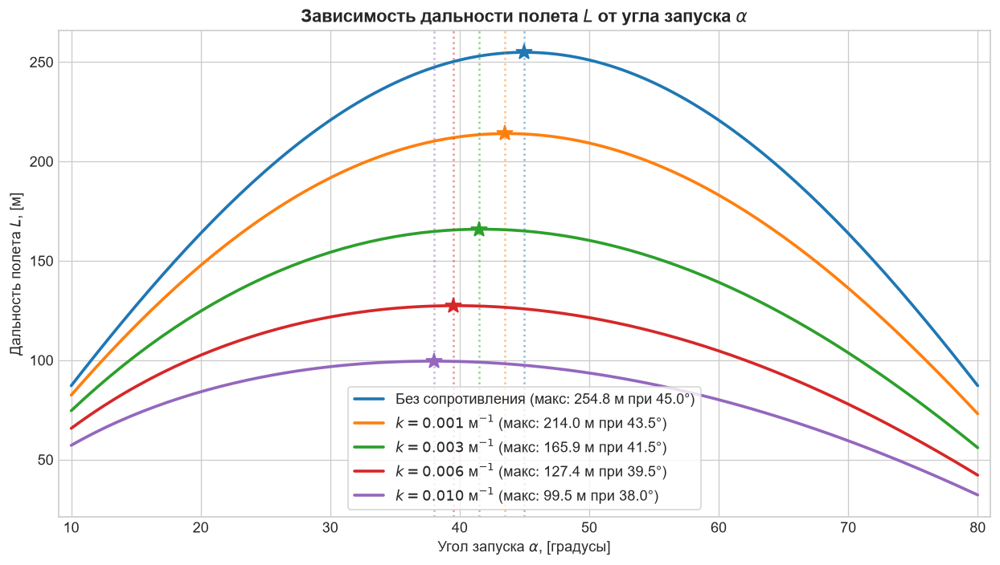

Коэффициент k, 1/м   | Оптимальный угол, град    | Макс. дальность, м  
------------------------------------------------------------------------
0.0000               | 45.0                      | 254.84              
0.0010               | 43.5                      | 213.96              
0.0030               | 41.5                      | 165.88              
0.0060               | 39.5                      | 127.41              
0.0100               | 38.0                      | 99.51               


In [11]:
k_values = [0.0, 0.001, 0.003, 0.006, 0.010]
angles_deg = np.linspace(10, 80, 141)  # перебор с шагом 0.5 градуса

results_opt = []

plt.figure(figsize=(10.5, 6))

for k_val in k_values:
    ranges = []
    for a_deg in angles_deg:
        _, s = simulate_quad(v0, np.radians(a_deg), k_val, g, dt=0.01)
        ranges.append(s[-1, 0])
        
    ranges = np.array(ranges)
    idx_max = np.argmax(ranges)
    opt_angle = angles_deg[idx_max]
    max_range = ranges[idx_max]
    results_opt.append((k_val, opt_angle, max_range))
    
    label_txt = (rf"$k = {k_val:.3f}$ м$^{{-1}}$ (макс: {max_range:.1f} м при {opt_angle:.1f}°)" 
                 if k_val > 0 else f"Без сопротивления (макс: {max_range:.1f} м при {opt_angle:.1f}°)")
    
    line = plt.plot(angles_deg, ranges, lw=2.2, label=label_txt)
    color = line[0].get_color()
    
    # Отметка максимума
    plt.plot(opt_angle, max_range, marker='*', markersize=12, color=color)
    plt.axvline(opt_angle, color=color, linestyle=':', alpha=0.5)

plt.title(r'Зависимость дальности полета $L$ от угла запуска $\alpha$', fontweight='bold')
plt.xlabel(r'Угол запуска $\alpha$, [градусы]')
plt.ylabel(r'Дальность полета $L$, [м]')
plt.xlim(9, 81)
plt.legend(frameon=True)
plt.tight_layout()
plt.show()

# Сводная таблица оптимальных углов
print(f"{'Коэффициент k, 1/м':<20} | {'Оптимальный угол, град':<25} | {'Макс. дальность, м':<20}")
print("-" * 72)
for k_val, opt_a, max_r in results_opt:
    print(f"{k_val:<20.4f} | {opt_a:<25.1f} | {max_r:<20.2f}")


### 5. Проверка сходимости при уменьшении шага интегрирования $\Delta t$
Убедимся в надежности найденных результатов: проверим, как изменяется расчетная дальность полета при последовательном дроблении шага по времени $\Delta t \in [0.2, 0.1, 0.05, 0.02, 0.01, 0.005, 0.001]$ с (на примере $k = 0.005$ 1/м и угла $\alpha = 40.0^\circ$).


In [12]:
dt_test_list = [0.2, 0.1, 0.05, 0.02, 0.01, 0.005, 0.001]
k_test = 0.005
alpha_test_rad = np.radians(40.0)

print(f"{'Шаг dt, с':<12} | {'Дальность L, м':<18} | {'Разность с dt=0.001 с, мм':<25}")
print("-" * 62)

ranges_dt = []
for dt in dt_test_list:
    _, s = simulate_quad(v0, alpha_test_rad, k_test, g, dt=dt)
    ranges_dt.append(s[-1, 0])

ref_range = ranges_dt[-1]
for dt, r in zip(dt_test_list, ranges_dt):
    diff_mm = abs(r - ref_range) * 1000.0
    print(f"{dt:<12.4f} | {r:<18.5f} | {diff_mm:<25.2f}")


Шаг dt, с    | Дальность L, м     | Разность с dt=0.001 с, мм
--------------------------------------------------------------
0.2000       | 137.65707          | 28.38                    
0.1000       | 137.67672          | 8.72                     
0.0500       | 137.68442          | 1.02                     
0.0200       | 137.68525          | 0.20                     
0.0100       | 137.68537          | 0.08                     
0.0050       | 137.68543          | 0.02                     
0.0010       | 137.68544          | 0.00                     


### 6. Физические выводы и ответы на вопросы

#### 1. Как сопротивление воздуха изменяет оптимальный угол запуска?
- **В вакууме ($k = 0$):** оптимальный угол строго равен $\alpha_{\text{opt}} = 45^\circ$, что является следствием формулы Галилея $L = \frac{v_0^2 \sin(2\alpha)}{g}$, максимум которой достигается при $\sin(2\alpha) = 1 \implies \alpha = 45^\circ$.
- **При наличии сопротивления ($k > 0$):** оптимальный угол **монотонно уменьшается** ниже $45^\circ$ (для $k = 0.005$ 1/м он составляет $\approx 40.5^\circ$, а для $k = 0.010$ 1/м снижается до $38.0^\circ$).
- **Физическая причина:** Дальность полета определяется балансом между временем нахождения в воздухе $t_{\text{пол}}$ и скоростью горизонтального продвижения $v_x$. При увеличении угла возрастает время полета, однако сила аэродинамического сопротивления $\vec{F}_{\text{сопр}} = -m k |\vec{v}|\vec{v}$ пропорциональна квадрату скорости. Чем дольше тело летит, тем большую отрицательную работу совершает сопротивление, беспощадно «съедая» кинетическую энергию. Более настильная траектория (меньший угол) позволяет телу пройти горизонтальную дистанцию быстрее, минимизируя потери энергии на трение о воздух.

#### 2. Как сопротивление среды изменяет симметрию траектории?
- **В вакууме:** траектория представляет собой абсолютно симметричную параболу. Время подъема до вершины равно времени спуска ($t_{\text{под}} = t_{\text{сп}}$), вершина делит дальность ровно пополам ($x_{\text{верш}} = \frac{1}{2} L$), а угол приземления равен углу запуска.
- **При квадратичном сопротивлении:** симметрия **полностью нарушается**:
  1. Горизонтальная скорость $v_x(t)$ монотонно и быстро падает. Из-за этого восходящая ветвь траектории оказывается пологой и растянутой по горизонтали, а нисходящая — крутой и сжатой.
  2. Вершина траектории смещается вперед: $x_{\text{верш}} > \frac{1}{2} L$.
  3. Угол падения на землю по модулю значительно превышает угол запуска ($\theta_{\text{пад}} > \alpha$). На заключительном этапе падения горизонтальная скорость практически затухает, и тело приближается к почти вертикальному падению с установившейся предельной скоростью $v_{\text{пред}} = \sqrt{g/k}$.
